In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import cmath
import os

#**Manipulation 1 : Réduction du bruit**

# 1. Lire et afficher l’image « isabelle.bmp »:

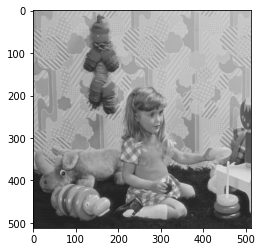

In [ ]:
image = cv.imread('/content/isabelle.bmp')
plt.imshow(image)

In [ ]:
image.shape

(512, 512, 3)

# 2. Bruit gaussien:


Text(0.5, 1.0, 'image bruitée.')

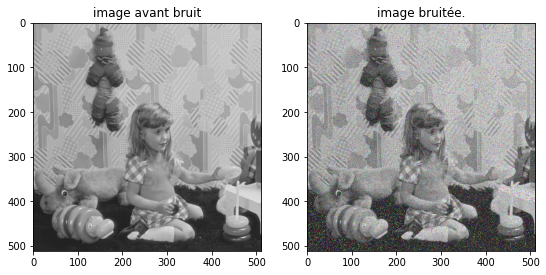

In [ ]:
plt.figure(figsize=(9,9))
bruit = np.random.normal(0,0.1,image.shape)
bruit_gaussien = np.multiply(bruit,255)
image_bruitée = (image + bruit_gaussien).astype(np.uint8)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title('image avant bruit')
plt.subplot(1,2,2)
plt.imshow(image_bruitée,cmap='gray')
plt.title('image bruitée.')

**A. Filtre moyenneur :**

(512, 512, 3)


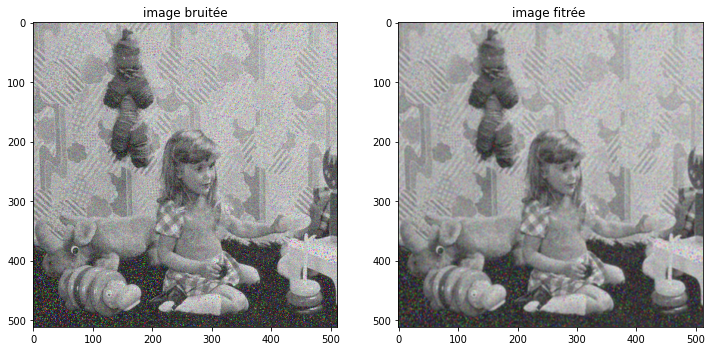

In [ ]:
#methode 1: 
plt.figure(figsize=(12,12))
ksize = (3,3)
image_filtree= cv.blur(image_bruitée,ksize).astype(np.uint8)
plt.subplot(1,4,2)
plt.subplot(1,2,1)
plt.imshow(image_bruitée,cmap='gray')
plt.title('image bruitée')
plt.subplot(1,2,2)
plt.imshow(image_filtree,cmap='gray')
plt.title('image fitrée ')
print(image_filtree.shape)

# Commentaires:


*   On remarque une réduction du bruit sur l'image bruitée, mais au meme temps l'image est devenue floue.
*   Ce filtre a apliquer un effect de lissage sur l'image bruitée, les contours ne figurent pas bien sur l'image résultante.
*   La taille de l'image resultante est 512x512 pixels et c'est la meme taille de l'image originale ce qui est logique car on a pas modifier le nombre de pixels.
*   Les bords ont été traites par défaut:





**méthode 2:**

In [ ]:
#methode 2:
# on va cree une fonction qui calcule la convolution de 2 matrices :

def convolution2D(X,H,moitie):
    s = X.shape
    py = int((H.shape[0]-1)/2)
    px = int((H.shape[1]-1)/2)
    Y = X.copy()
    if moitie:
        imax = int(s[1]/2)
    else:
        imax = s[1]-px
    for i in range(px,imax):
        for j in range(py,s[0]-py):
            somme = 0.0
            for k in range(-px,px+1):
                for l in range(-py,py+1):
                    somme += X[j+l][i+k]*H[l+py][k+px]
            Y[j][i] = somme
    return Y
  # apres on va cree un le filtre:
H=np.ones((3,3))*(1.0/9)
  #new_image = convolution2D(image_bruitée,H,False)
new_img = convolution2D(image_bruitée,H,False)

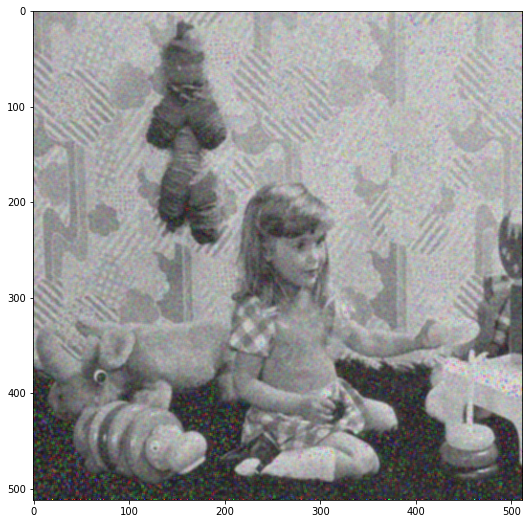

In [ ]:
#affichage le l'image filtree:
plt.figure(figsize=(9,9))
plt.imshow(new_img)

# Conclusion:
Les deux methodes ont appliqué un effect de lissage sur l'image bruitee, ce type de filtre ajoute du floue a l'image et rend les details moins visibles, c'est un filtre spaciale passe bas(il elimine les hautes fréquences).

# 2. Soustraction de l'image bruitée et l'image filtrée:

Text(0.5, 1.0, "soustraction de l'image bruitée et l'image filtrée ")

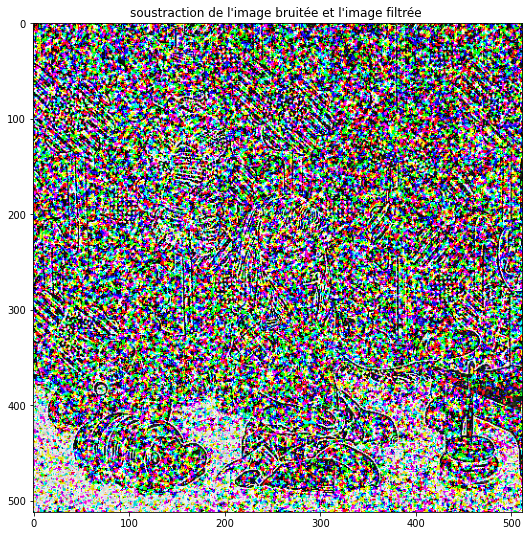

In [ ]:
# soustraction de l'image bruitée et l'image filtrée:
plt.figure(figsize=(9,9))
sous = image - image_filtree
plt.imshow(sous.astype(np.uint8),cmap='gray')
plt.title("soustraction de l'image bruitée et l'image filtrée ")


# Commentaires:

*   Le resultat de la soustraction sont les details de l'image bruitee qui ont ete supprimes lors du filtrage(lissage).









# 3. refaire les étapes pour un masque 5x5 6x6 7x7:

(512, 512, 3)
(512, 512, 3)
(512, 512, 3)


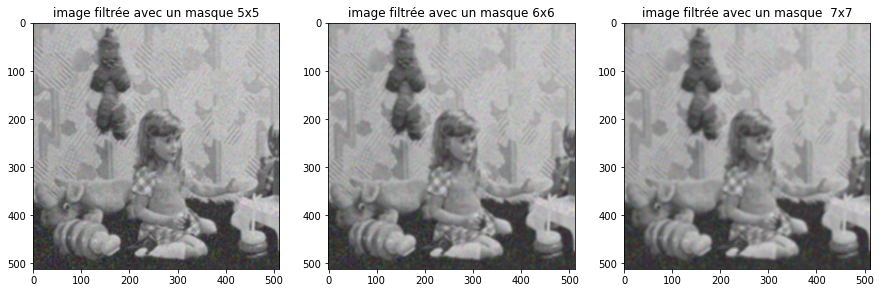

In [ ]:
plt.figure(figsize=(15,17))
#Filtrage moyen 5x5
img_filtre2= cv.blur(image_bruitée,(5,5)).astype(np.uint8)
plt.subplot(1,3,1)
plt.title("image filtrée avec un masque 5x5")
plt.imshow(img_filtre2, cmap="gray")
print(img_filtre2.shape) 

#Filtrage moyen 6x6
img_filtre3= cv.blur(image_bruitée, (6, 6)).astype(np.uint8)
plt.subplot(1,3,2)
plt.title("image filtrée avec un masque 6x6")
plt.imshow(img_filtre3, cmap="gray")
print(img_filtre3.shape) 

#Filtrage moyen 7x7
img_filtre4= cv.blur(image_bruitée, (7, 7)).astype(np.uint8)
plt.subplot(1,3,3)
plt.title("image filtrée avec un masque  7x7")
plt.imshow(img_filtre4, cmap="gray")
print(img_filtre4.shape)

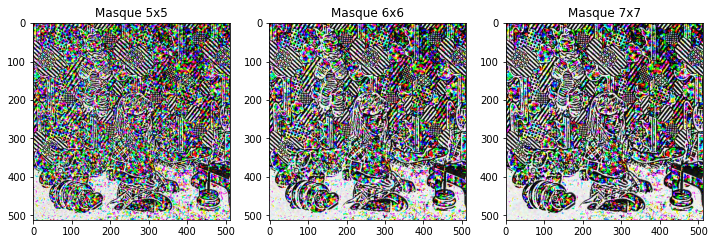

In [ ]:
plt.figure(figsize=(12,15))
#Soustraction entre l’image originale et l’image filtrée 5x5
sous2 = image - img_filtre2
plt.subplot(1,3,1)
plt.title("Masque 5x5")
plt.imshow(sous2.astype(np.uint8), cmap="gray")

#Soustraction entre l’image originale et l’image filtrée 6x6
sous3 = image - img_filtre3
plt.subplot(1,3,2)
plt.title("Masque 6x6")
plt.imshow(sous3.astype(np.uint8), cmap="gray")

#Soustraction entre l’image originale et l’image filtrée 7x7
sous4 = image - img_filtre4
plt.subplot(1,3,3)
plt.title("Masque 7x7")
plt.imshow(sous4.astype(np.uint8), cmap="gray")

# Conclusion:


*   A chaque fois qu'on augmente le masque l'image résultante devient plus lisse et elle perd plus de détails.
*   Et a chaque fois qu'on augmente le masque la soustraction des deux images montre qu'il ya plus de différence entre l'image filtrée et l'image bruitée lorsque le masque est plus grand, ce qui est logique car plus on augmente le masque plus on perd de détails.

*   Les filtre moyenneurs sont des filtre basse bas, ils réduisent le bruit en ajoutant un effet de lissage sur l'image bruitée.
*   plus le filtre est important plus l'image perd de détails.









**2. Filtre gaussien:**

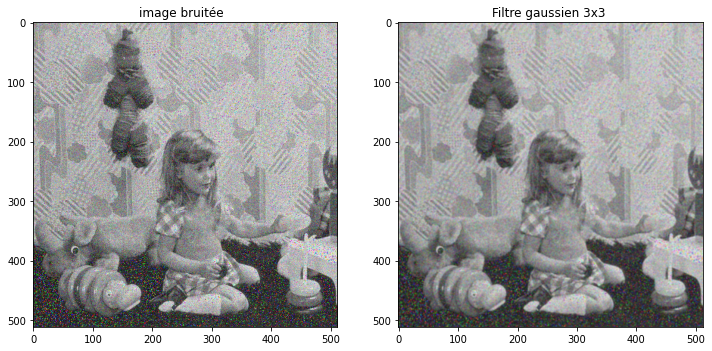

In [ ]:
# un filtre gaussien 3x3 avec sigma= 1 
plt.figure(figsize=(12,12))
filtre_gauss = cv.GaussianBlur(image_bruitée,(3,3),1)
plt.subplot(1,2,1)
plt.title('image bruitée  ')
plt.imshow(image_bruitée,cmap='gray')

plt.subplot(1,2,2)
plt.title('Filtre gaussien 3x3 ')
plt.imshow(filtre_gauss,cmap='gray')



#Commentaires:
On remarque que le filtre gaussien a reduit le bruit en ajoutant moins de floue paraport au filtre moyenneur.

# 2. l’influence de la taille du filtre et de la valeur de l’écart-type:

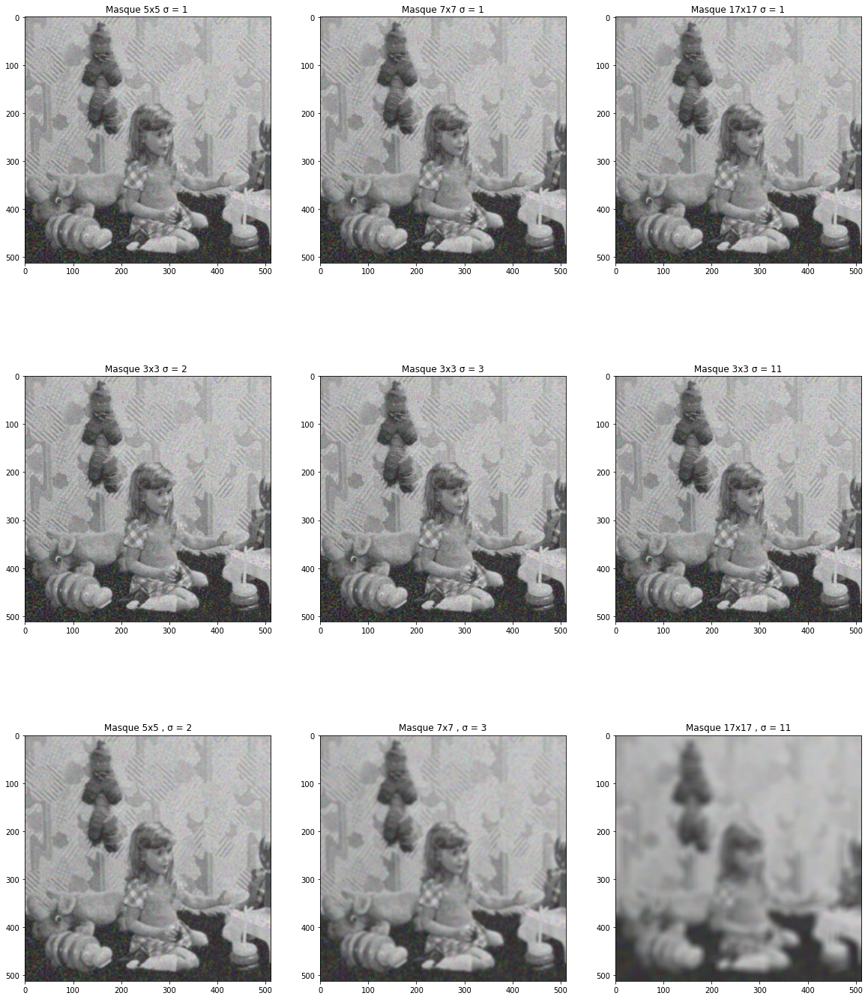

In [ ]:
plt.figure(figsize=(20,25))
# On fixe σ = 1
#Filtre gaussien 5x5 
filtr_gauss2 = cv.GaussianBlur(image_bruitée, (5, 5), 1)
plt.subplot(3,3,1)
plt.title("Masque 5x5 σ = 1 ")
plt.imshow(filtr_gauss2.astype(np.uint8), cmap="gray")

#Filtre gaussien 7x7  
filtr_gauss3 = cv.GaussianBlur(image_bruitée, (7, 7), 1)
plt.subplot(3,3,2)
plt.title("Masque 7x7 σ = 1")
plt.imshow(filtr_gauss3.astype(np.uint8), cmap="gray")

#Filtre gaussien 17x17 
filtr_gauss4 = cv.GaussianBlur(image_bruitée, (17, 17), 1)
plt.subplot(3,3,3)
plt.title("Masque 17x17 σ = 1")
plt.imshow(filtr_gauss4.astype(np.uint8), cmap="gray")

# On varie sigma et on fixe la taille du filtre 3x3 :

#Filtre gaussien 
filtr_gauss_3x3_1 = cv.GaussianBlur(image_bruitée, (3, 3), 2)
plt.subplot(3,3,4)
plt.title("Masque 3x3 σ = 2 ")
plt.imshow(filtr_gauss_3x3_1.astype(np.uint8), cmap="gray")

#Filtre gaussien 
filtr_gauss_3x3_2 = cv.GaussianBlur(image_bruitée, (3, 3), 3)
plt.subplot(3,3,5)
plt.title("Masque 3x3 σ = 3")
plt.imshow(filtr_gauss_3x3_2.astype(np.uint8), cmap="gray")

#Filtre gaussien 
filtr_gauss_3x3_3 = cv.GaussianBlur(image_bruitée, (3, 3), 11)
plt.subplot(3,3,6)
plt.title("Masque 3x3 σ = 11")
plt.imshow(filtr_gauss_3x3_3.astype(np.uint8), cmap="gray")

# On varie et la taille du filtre et sigma :

#Filtre gaussien 5x5 , σ = 2
filtre_gauss2 = cv.GaussianBlur(image_bruitée, (5, 5), 2)
plt.subplot(3,3,7)
plt.title("Masque 5x5 , σ = 2")
plt.imshow(filtre_gauss2.astype(np.uint8), cmap="gray")

#Filtre gaussien 7x7 , σ = 3
filtre_gauss3 = cv.GaussianBlur(image_bruitée, (7, 7), 3)
plt.subplot(3,3,8)
plt.title("Masque 7x7 , σ = 3")
plt.imshow(filtre_gauss3.astype(np.uint8), cmap="gray")

#Filtre gaussien 17x17 , σ = 11
filtre_gauss4 = cv.GaussianBlur(image_bruitée, (17, 17), 11)
plt.subplot(3,3,9)
plt.title("Masque 17x17 , σ = 11")
plt.imshow(filtre_gauss4.astype(np.uint8), cmap="gray")



# Commentaires:

* Dan le premier cas on a fixé sigma en augmentant le filtre, et on remarque que l'image resultante n'est pas trop lisser meme si on augmente le masque.
* Dans le deuxieme cas on a aumenter sigma, en fixant la taille du masque, dans ce cas aussi on a pas remarque un gand lissage sur l'image resultante.
* Dans le dernier cas on a aumenter sigma, on aumentant la taille du masque et on remarque que l'image devient plus floue et plus lisse pour chaque augmentation de sigma.

* Onconclue que le degre de lissage depond du parametre sigma plus ce parametre augmente plus on aura une image plus lisse mais il faut aussi augmenter la taille du masque.












## 3. Soustraction:

Text(0.5, 1.0, "soustraction de l'image originale et l' image filtree")

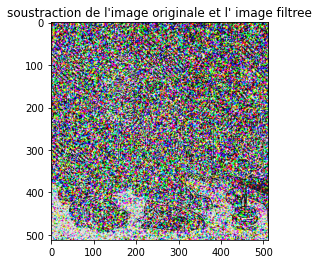

In [ ]:
# ici j'ai choisi l'image avec un filtre 3x3 et σ = 2
sousf = image - filtr_gauss_3x3_1
plt.imshow(sousf)
plt.title("soustraction de l'image originale et l' image filtree")

# Commentaire:
Le resultat de soustration nous montre que la diffrence entre l'image bruitee et l'image originale n'est pas assez grande comme dans le cas du filtre moyenneur donc le filtre gaussien a reduit le bruit tout en preservant les details (contours).

## **3. Filtre médian :**

# 1. Réaliser un filtrage médian:

Text(0.5, 1.0, 'image avec un filtre 9x9 ')

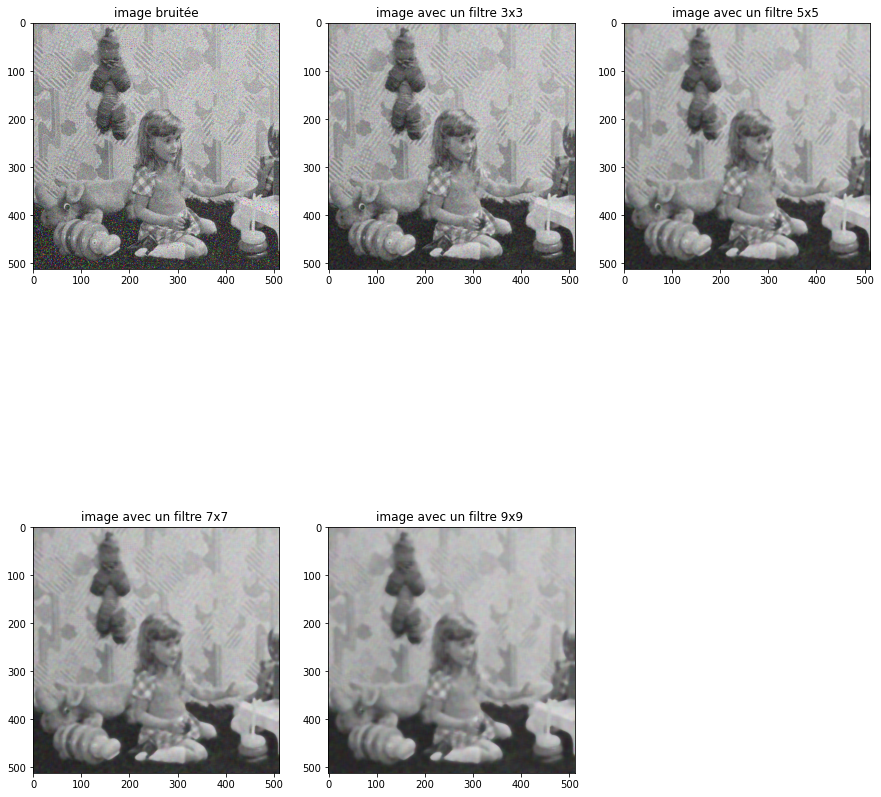

In [ ]:
plt.figure(figsize=(15,17))
plt.subplot(2,3,1)
plt.imshow(image_bruitée)
plt.title("image bruitée")
# filtre 3x3 :
plt.subplot(2,3,2)
img1= cv.medianBlur(image_bruitée,3)
plt.imshow(img1)
plt.title("image avec un filtre 3x3 ")
# filtre 5x5 :
plt.subplot(2,3,3)
img2= cv.medianBlur(image_bruitée,5)
plt.imshow(img2)
plt.title("image avec un filtre 5x5 ")
# filtre 7x7 :
plt.subplot(2,3,4)
img3= cv.medianBlur(image_bruitée,7)
plt.imshow(img3)
plt.title("image avec un filtre 7x7 ")
# filtre 9x9 :
plt.subplot(2,3,5)
img4= cv.medianBlur(image_bruitée,9)
plt.imshow(img4)
plt.title("image avec un filtre 9x9 ")


# Comparaison:


*   Le filtre median a reduit le bruit mais en ajoutant du floue a l'image (effet de lissage).
*   Plus on aumente la taille du masque plus l'image devient floue.
# Conclusion:
Le filtre median est un filtre basse bas, il elimine les hautes frequences (contours) en ajoutant du floue a l'image.



# 3. soustraction :

Text(0.5, 1.0, "soustraction de l'image originale et l' image filtree")

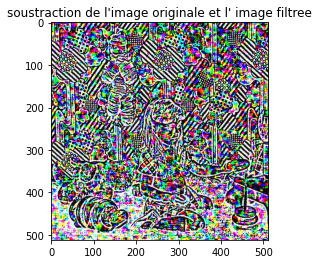

In [ ]:
# ici j'ai choisi l'image avec un filtre 5x5 
sousM = image - img3
plt.imshow(sousM)
plt.title("soustraction de l'image originale et l' image filtree")

# Commentaire:
On remarque qu'il y a beacoup de détails qui ont ete supprimés paraport a l'image bruitée.

# Comparaison des filtres :

Text(0.5, 1.0, 'filtre median avec un filtre 5x5 ')

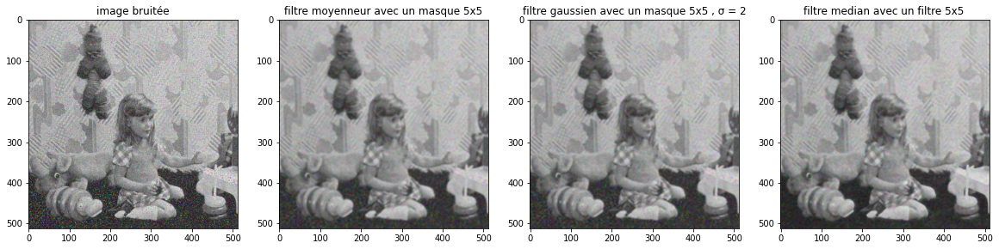

In [ ]:
# Comparaison des filtres :
# image bruitee:
plt.figure(figsize=(20,25))
plt.subplot(1,4,1)
plt.imshow(image_bruitée)
plt.title("image bruitée")
# filtre moyenneur:
plt.subplot(1,4,2)
plt.title("filtre moyenneur avec un masque 5x5")
plt.imshow(img_filtre2, cmap="gray")
# filtre gaussien :
plt.subplot(1,4,3)
plt.title("filtre gaussien avec un masque 5x5 , σ = 2")
plt.imshow(filtre_gauss2.astype(np.uint8), cmap="gray")
# filtre median :
plt.subplot(1,4,4)
plt.imshow(img2)
plt.title("filtre median avec un filtre 5x5 ")

# Comparaison:
* On remarque que les 3 filtres sont des filtres passe-bas , ils ajoutent du floue à l'image, éliminent ses détails et ont un effect de lissage sur l'image.

* Le filtre gaussien et le filtre moyenneur sont des filtres linéaires , par contre  que le filtre médian est non-linéaire, il fait
intervenir les pixels voisins.
* Le filtre moyenneur et le filtre median ont réussi à réduire le bruit gaussien mais en rajoutant du floue à l'image(lissage), en eliminant les détails (élimination des contours).
* On remarque que le filtre gaussien est le filtre qui a ajouter moins de floue tout en reduisant le bruit.

# Conclusion:
Le filtre gaussien est le filtre le mieux adapté pour le bruit gaussien.

# 3. Refaire le meme travail pour un bruit impulsionnel:

# 3.1. création de l'image bruitée:

In [ ]:
# On va d'abord cree la fonction impulse :
def impulse(img,amount):
  row,col,colo = img.shape
  s_vs_p = 0.5
  out = np.copy(img)
  # Salt mode
  num_salt = np.ceil(amount * img.size * s_vs_p)
  coords = [np.random.randint(0, i - 1, int(num_salt)) for i in img.shape]
  out[coords] = 255
  # Pepper mode
  num_pepper = np.ceil(amount* img.size * (1. - s_vs_p))
  coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in img.shape]
  out[coords] = 0
  return out



<ipython-input-51-6418ea8a6ef9>:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 255
<ipython-input-51-6418ea8a6ef9>:13: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 0


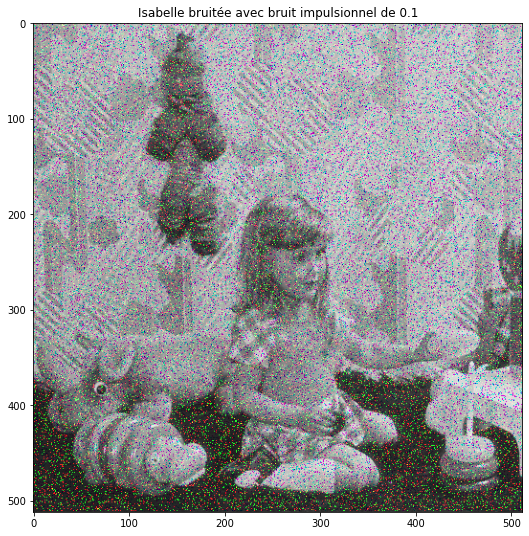

In [ ]:
# ajout du bruit a l'image avec un bruit de 0.1:
plt.figure(figsize=(9,9))
img_impul = impulse(image,0.1)
plt.title("Isabelle bruitée avec bruit impulsionnel de 0.1")
plt.imshow(img_impul.astype(np.uint8), cmap="gray")


# 1.filtre moyenneur:


In [ ]:
# fonction pour le filtre moyenneur:
def moyenneur(img,k):
  img_filtre= cv.blur(img,(k,k)).astype(np.uint8)
  plt.title("image filtrée avec un masque" +str(k) +"x"+str(k))
  plt.imshow(img_filtre, cmap="gray")
  return img_filtre
# fonction pour le filtre gaussien:
def gaussien(img,k,sigma):
  filtr_gauss = cv.GaussianBlur(img, (k, k), sigma)
  plt.title("Masque "+ str(k)+ "x" +str(k)+"avec σ = "+str(sigma))
  plt.imshow(filtr_gauss.astype(np.uint8), cmap="gray")
  return filtr_gauss

#fonction pour le filtre median:
def median(img,k):
  filtre_median= cv.medianBlur(img,5)
  plt.imshow(filtre_median)
  plt.title("image avec un filtre"+str(k)+"x"+str(k))
  return filtre_median
# fonction de soustraction:
def soustraction(img,img_bruit):
  result=img-img_bruit
  plt.imshow(result.astype(np.uint8),cmap='gray')
  plt.title("soustraction  ")



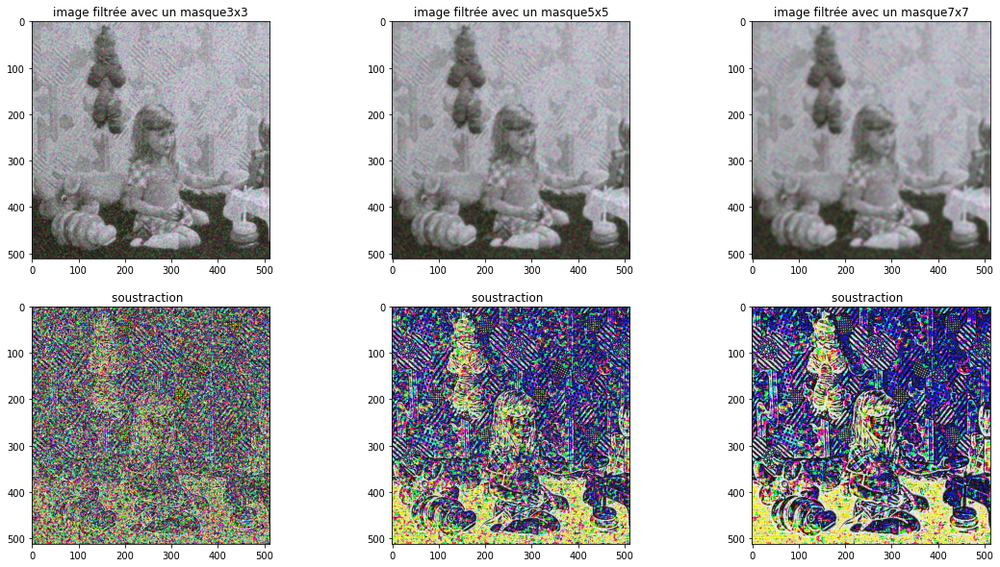

In [ ]:
# Filtre moyenneur:
plt.figure(figsize=(19,10))
j=1
for i in np.arange(3,8,2):
  plt.subplot(2,3,j)
  img_moy = moyenneur(img_impul,i)
  plt.subplot(2,3,j+3)
  soustraction(img_impul,img_moy)
  j=j+1

  

 



# Commentaires:


*   Le filtre moyenneur a reussi a reduire le bruit tout en ajoutant du floue a l'image(effect de lissage) en eliminant les details.
*   A chauqe fois qu'on aumente la taille du masque le floue augmente et on perd plus de details.
*   La soustraction de l'image filtree et l'image originale nous montre qu'il y a une difference entre ces deux, ce qui veut dire que le filtre moyenneur a reduit le bruit en eliminant quelaue details de l'image.
*  Plus on aumente la taille du masque plus on perd plus de details.







# Conclusion:
Le filtre moyenneur peut servir a réduire le bruit impultionnel mais en ajoutant un effet de lissage sur l'image qui augmente avec la taille du masque, c'est un filtre basse bas qui élimine les hautes fréquences (Contours).

# 2. Filtre gaussien:

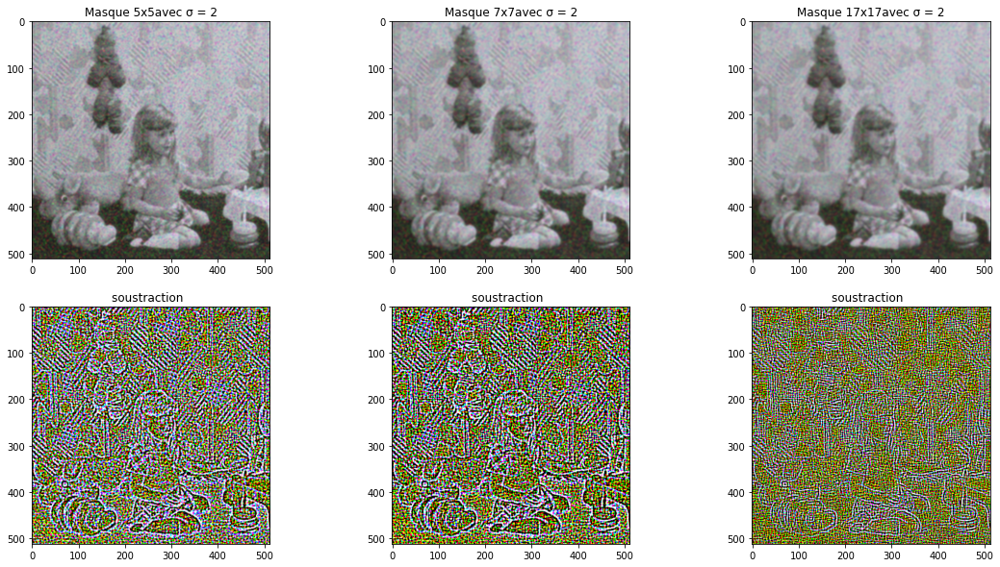

In [ ]:
# Filtre gaussien:
plt.figure(figsize=(19,10))
tableau=np.array([[5,7,17],[2,3,11]])
j=1
for i in tableau[0,:]:
  m=0
  sigma=tableau[1,m]
  plt.subplot(2,3,j)
  img_gaussienne = gaussien(img_impul,i,sigma)
  plt.subplot(2,3,j+3)
  soustraction(img_gaussienne,img_moy)
  j=j+1

# Commentaire:
*   Le filtre gaussien a réussi a réduire le bruit mais en ajoutant du floue a l'image(effect de lissage) et en éliminant les détails.
*   A chaque fois qu'on augmente  sigma et la taille de masque le floue augmente.
*   La soustraction de l'image filtrée et l'image originale nous montre qu'il y a une différence entre ces deux, ce qui veut dire que le filtre gaussien a reduit le bruit en eliminant quelques details de l'image, 
*  Plus on aumente la taille du masque et sigma plus on perd plus de details.

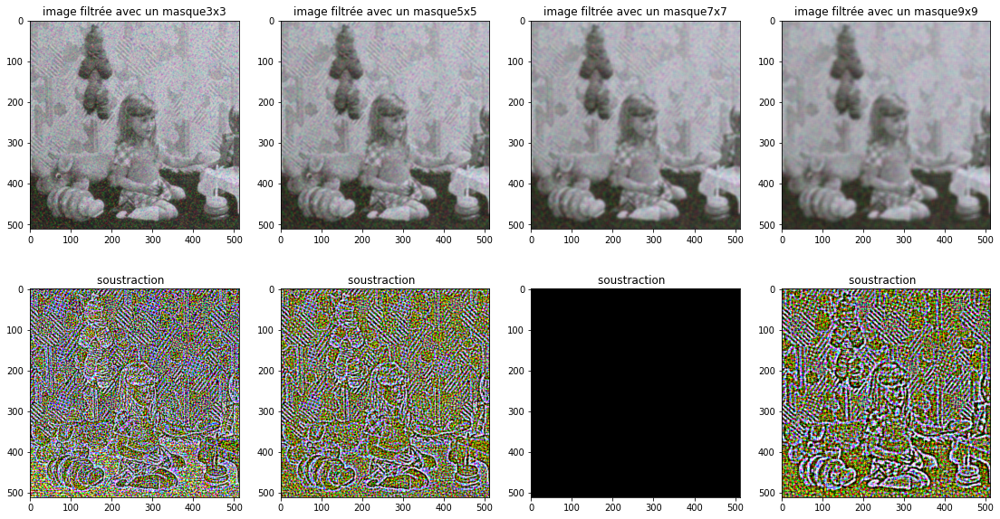

In [ ]:
#Filtre median:
plt.figure(figsize=(19,10))
j=1
for i in np.arange(3,10,2):

  plt.subplot(2,4,j)
  img_median = moyenneur(img_impul,i)
  plt.subplot(2,4,j+4)
  soustraction(img_median,img_moy)
  j=j+1


# Commentaire:
*   Le filtre median a réussi a réduire le bruit mais en ajoutant du floue a l'image(effect de lissage) et en éliminant les détails.
*   A chaque fois qu'on augmente la taille de masque le floue augmente.
*   La soustraction de l'image filtrée et l'image originale nous montre qu'il y a une différence entre ces deux, ce qui veut dire que le filtre median a reduit le bruit en eliminant quelques details de l'image, 
*  Plus on aumente la taille du masque  plus on perd plus de details.

# Comparaison entre les filtres:
* Le filtre moyenneur a réduit le bruit impulsionnel mais en ajoutant un effect de lissage sur l'image en eliminant les details.
* Le filtre gaussien a réduit le bruit en ajoutant moins de floue, ce qui se voit dans les images représentant la soustraction entre l'image bruitée et l'image filtrée.
* Le filtre médian marche tres bien sur ce type de bruit, il a bien réduit le  bruit,tout en préservant les details (contours) de l'image, ce qui se voit dans les images représentant la soustraction entre l'image bruitée et l'image filtrée.
# Conclusion:
Le filtre médian est le mieux adapté au bruit impultionnel.

# **Manip 2 : Detection des contours**

# 1. Lire et afficher l’image « lena.png »:

Text(0.5, 1.0, 'image de lena')

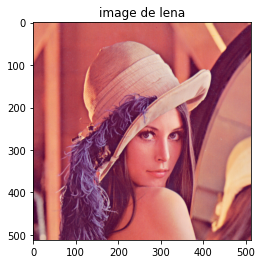

In [ ]:
lena = cv.imread('/content/lena.png')
lena = cv.cvtColor(lena, cv.COLOR_BGR2RGB)
plt.imshow(lena)
plt.title("image de lena")

# 2.Transformation de l'image en niveaux de gris:

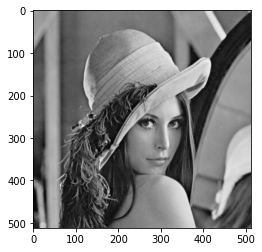

In [ ]:
# transformation de l'image en niveaux de gris:
lena_gris= cv.cvtColor(lena, cv.COLOR_RGB2GRAY)
plt.imshow(lena_gris,cmap='gray')

<ipython-input-14-a4de48c3912d>:10: RuntimeWarning: invalid value encountered in true_divide
  phase=np.arctan(Gy/Gx)
<ipython-input-14-a4de48c3912d>:32: RuntimeWarning: divide by zero encountered in true_divide
  phase_sobel=np.arctan(Gy_sobel/Gx_sobel)
<ipython-input-14-a4de48c3912d>:32: RuntimeWarning: invalid value encountered in true_divide
  phase_sobel=np.arctan(Gy_sobel/Gx_sobel)
<ipython-input-14-a4de48c3912d>:52: RuntimeWarning: divide by zero encountered in true_divide
  phase_pewitt=np.arctan(Gy_pewitt/Gx_pewitt)
<ipython-input-14-a4de48c3912d>:52: RuntimeWarning: invalid value encountered in true_divide
  phase_pewitt=np.arctan(Gy_pewitt/Gx_pewitt)


Text(0.5, 1.0, 'filtre pewitt phase')

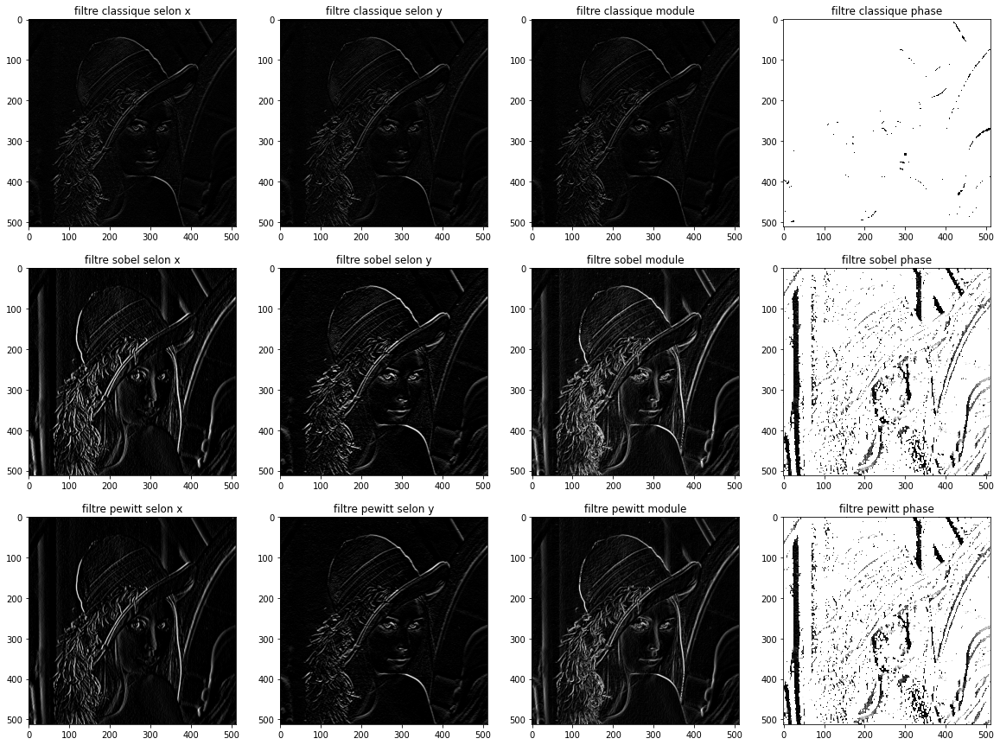

In [ ]:
plt.figure(figsize=(20,15))
# filtre classique:
hx=np.array([-1,1])
hy= np.transpose(hx)
Gx=cv.filter2D(lena_gris,-1,hx)
Gy=cv.filter2D(lena_gris,-1,hy)
G1=np.square(Gx.astype(np.float32))+np.square(Gy.astype(np.float32))
G= np.sqrt(G1)
module=G.astype(np.uint8)
phase=np.arctan(Gy/Gx)
plt.subplot(3,4,1)
plt.imshow(Gx,cmap='gray')
plt.title("filtre classique selon x")
plt.subplot(3,4,2)
plt.imshow(Gx,cmap='gray')
plt.title("filtre classique selon y")
plt.subplot(3,4,3)
plt.imshow(module,cmap='gray')
plt.title("filtre classique module")
plt.subplot(3,4,4)
plt.imshow(phase,cmap='gray')
plt.title("filtre classique phase")

# filtre sobel:
sobel_hx=np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
sobel_hy=np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
Gx_sobel=cv.filter2D(lena_gris,-1,sobel_hx)
Gy_sobel=cv.filter2D(lena_gris,-1,sobel_hy)
G_sobel= np.square(Gx_sobel.astype(np.float32))+np.square(Gy_sobel.astype(np.float32))
module_sobel1=np.sqrt(G_sobel)
module_sobel=module_sobel1.astype(np.uint8)
phase_sobel=np.arctan(Gy_sobel/Gx_sobel)
plt.subplot(3,4,5)
plt.imshow(Gx_sobel,cmap='gray')
plt.title("filtre sobel selon x")
plt.subplot(3,4,6)
plt.imshow(Gy_sobel,cmap='gray')
plt.title("filtre sobel selon y")
plt.subplot(3,4,7)
plt.imshow(module_sobel,cmap='gray')
plt.title("filtre sobel module")
plt.subplot(3,4,8)
plt.imshow(phase_sobel,cmap='gray')
plt.title("filtre sobel phase")
#filtre pewitt:
pewitt_hx=np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
pewitt_hy=np.array([[-1,-1,-1],[0,0,0],[1,1,1]])
Gx_pewitt=cv.filter2D(lena_gris,-1,pewitt_hx)
Gy_pewitt=cv.filter2D(lena_gris,-1,pewitt_hy)
G_pewitt1= np.sqrt(np.square(Gx_pewitt.astype(np.float32))+np.square(Gy_pewitt.astype(np.float32)))
module_pewitt=G_pewitt1.astype(np.uint8)
phase_pewitt=np.arctan(Gy_pewitt/Gx_pewitt)
plt.subplot(3,4,9)
plt.imshow(Gx_pewitt,cmap='gray')
plt.title("filtre pewitt selon x")
plt.subplot(3,4,10)
plt.imshow(Gy_pewitt,cmap='gray')
plt.title("filtre pewitt selon y")
plt.subplot(3,4,11)
plt.imshow(module_pewitt,cmap='gray')
plt.title("filtre pewitt module")
plt.subplot(3,4,12)
plt.imshow(phase_pewitt,cmap='gray')
plt.title("filtre pewitt phase")




# Comparaison des filtres:

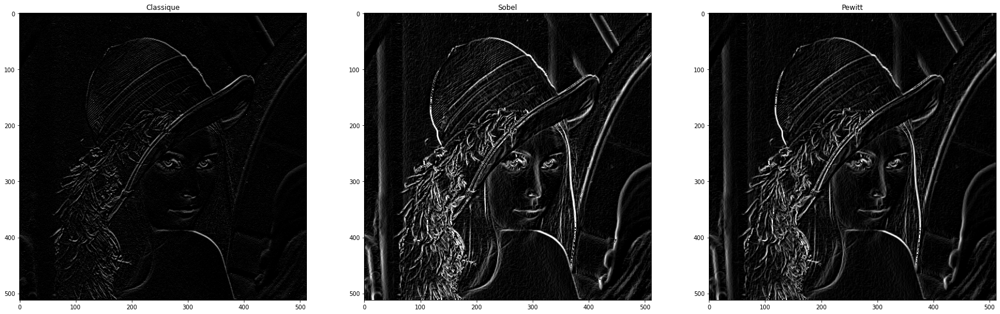

In [ ]:
#Comparer les filtres 
plt.figure(figsize=(30, 30))

plt.subplot(1,3,1),plt.imshow(module,cmap = 'gray')
plt.title('Classique')

plt.subplot(1,3,2),plt.imshow(module_sobel,cmap = 'gray')
plt.title('Sobel')

plt.subplot(1,3,3),plt.imshow(module_pewitt,cmap = 'gray')
plt.title('Pewitt')
plt.show()

# Comaparaison:
* On remarque que les 3 ne laissent que les contours (eliminent les bases frequences)et ils épaississent les contours.
*   On remarque que le filtre sobel epaisse les contours plus que les autres apres le filtre Prewitt et apres le filtre classique qui leurs epaisse le moins.
* On voit bien que le filtre de classique détecte les contours moins que le filtre de Prewitt et Sobel.
* Les filtres Prewitt et Sobel sont moins sensibles au bruit car le fait d'introduire un moyennage local sur le domaine couvert par le masque diminue leurs sensibilités.
* Le filtre de Sobel donne une meilleure estimation que celui de Prewitt car la série [1 2 1] est approximativement une gaussienne.


# 4. calculer et afficher le Laplacien 4-connexités et 8-connexités:

Text(0.5, 1.0, 'laplacien 8 connexités')

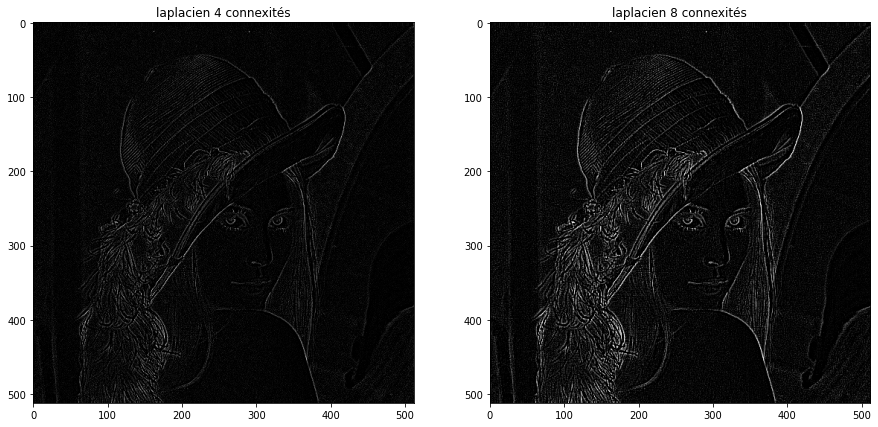

In [ ]:
plt.figure(figsize=(15,10))
# Calculer et afficher le laplacien 4 connexités:
plt.subplot(1,2,1)
lap = np.array([[0,1,0],[1,-4,1],[0,1,0]])
lena_4_connex=cv.filter2D(lena_gris,-1,lap)
plt.imshow(lena_4_connex,cmap="gray")
plt.title("laplacien 4 connexités")
# Calculer et afficher le laplacien 8 connexités:
plt.subplot(1,2,2)
lap2 = np.array([[1,1,1],[1,-8,1],[1,1,1]])
lena_8_connex=cv.filter2D(lena_gris,-1,lap2)
plt.imshow(lena_8_connex,cmap="gray")
plt.title("laplacien 8 connexités")


# Comparaison:
*   Les deux filtres epaissent les coutours mais le filtre 8 connexites les epaissent d'avantage.
*   Le filtre laplacien 8 connexites donne un meilleur resultat, il mais en evidence les contours mieux que le filtre 4-connexites, mais il genere du bruit.



# 5. Appliquer un filtrage gaussien avant de calculer le Laplacien 8-connexité:

Text(0.5, 1.0, 'laplacien 8 connexités sur un filtre gauss')

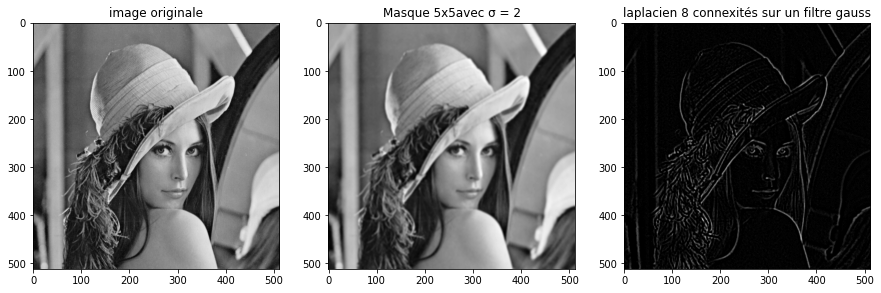

In [ ]:
plt.figure(figsize=(15,10))
# d'abord on applique le filtrage gaussien:
plt.subplot(1,3,1)
plt.imshow(lena_gris,cmap='gray')
plt.title("image originale")
plt.subplot(1,3,2)
lena_gauss = gaussien(lena_gris,5,2)
plt.subplot(1,3,3)
lap2 = np.array([[1,1,1],[1,-8,1],[1,1,1]])
lena_8_connex_gauss=cv.filter2D(lena_gauss,-1,lap2)
plt.imshow(lena_8_connex_gauss,cmap="gray")
plt.title("laplacien 8 connexités sur un filtre gauss")





# Comparaison:

Text(0.5, 1.0, 'laplacien 8 connexités sur un filtre gauss')

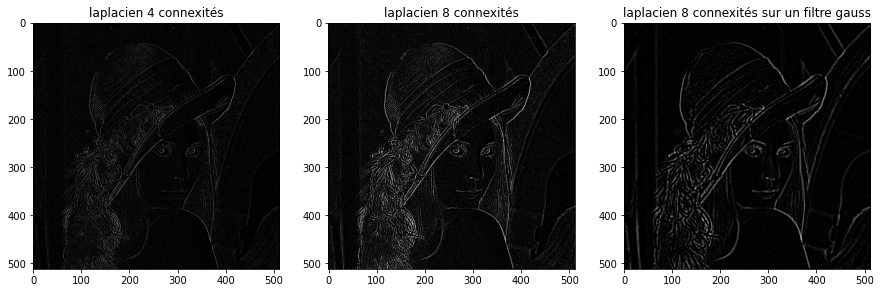

In [ ]:
plt.figure(figsize=(15,10))
plt.subplot(1,3,1)
# le laplacien 4 connexités:
plt.imshow(lena_4_connex,cmap="gray")
plt.title("laplacien 4 connexités")
# le laplacien 8 connexités:
plt.subplot(1,3,2)
plt.imshow(lena_8_connex,cmap="gray")
plt.title("laplacien 8 connexités")
# Gauss avant le laplacien 8 connexités
plt.subplot(1,3,3)
plt.imshow(lena_8_connex_gauss,cmap="gray")
plt.title("laplacien 8 connexités sur un filtre gauss")


# Comparaison entre les filtres:

*  Les filtres classique et laplacien 4-connexites donnent les moins bon resultats.
*   Les filtres sobel,prewitt et laplacien 8-connexites donnent les meilleurs resultats, mais le filtre laplacien 8-connexites genere du bruit.
*   Il faut appliquer um filtre gaussien avant le filtre laplacien 8-connexites pour de meilleurs resultats.







# **Conclusion :**
A travers ce tp on a pu réduire le bruit d'une image en appliquqnt différent types de filtres spaciales, on distingue deux type de filtres:


1. **Les filtres basse bas**:
ce type de filtres réduit le bruit mais en meme temps il élimine les hautes fréquences, c'est pour ça qu'il éffectue un effect de lissage sur l'image bruitée, l'image résultante est floue et lisse et elle contient moins de détails, il existe plusieurs filtres notament le filtre moyenneur qui remplace chaque valeur de pixel par la moyenne de son voisinage(la taille du voisinage et dit taille de masque et elle est définie au préalable), on a aussi le filtre gaussien qui pour chaque pixel aplique un filtre calculé à l'aide de la fonction gaussienne, le bon choix de la valeur de sigma a un grand effect sur le résultat, on distingue aussi le filtre médian qui remplace chaque valeur de pixel par la valeur médianne de voisinage .
*  D'apres le tp, on a conclue que le filtre gaussien est le mieux adapté pour un bruit gaussien car il donne plus d'importance au pixel central, et le filtre médian est meilleur pour un bruit impulsionnel
  
* On a aussi conclue que à chaque fois qu'on augmente la taille du filtre l'effect de lissage (floue) aumente et on perd plus de détails.
* Pour le filtre gaussien il faut augmenter sigma en augmentant la taille du masque.

2.   **Filtres passe haut :**
Ce type de filtres détecte les contours (changement brusque de l'intensité des niveaux de gris (hautes fréquences)) et élimine les basses fréquences.
Il existe plusieurs types de filtres:
*   le type de filtre classique, ou on va calculer le gradient de l'image suivant x qui va par la suite mettre en évidence les contours verticaux et suivant y qui va mettre en évidence les contours horizontaux.
*   On a aussi vu les filtres prewitt et sobel qui donnent un meilleur résultat que le filtre classique.
*  On a aussi vue le filtre laplacien 4-connexite et le filtre laplacien 8-connexite, et on a conclue que le laplacien 8-connexite donne un meilleur résultat mais en génerant du bruit, c'est pour ca il faut appliquer un filtre gaussien avant pour de mailleurs résultats.




